In [10]:
from viska.eval_rec import *

In [1]:
%load_ext autoreload
%autoreload 2

In [13]:
PROJECT_PATH = '../'
TRAIN_PATH = '/scratch/ceph/dobos/data/pfsspec/import/stellar/rbf/bosz_5000/pca/spectra.h5'
# TEST_PATH = '/scratch/ceph/swei20/data/pfsspec/train/ae/dataset/bosz/nowave/norm_mr_10k'

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [4]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [5]:
import os
import sys
import h5py
import numpy as np
import matplotlib.pyplot as plt

In [6]:
# Allow load project as module
sys.path.insert(0, PROJECT_PATH)

In [7]:
os.environ['PFSSPEC_DATA'] = r'/scratch/ceph/dobos/data/pfsspec'
os.environ['PYSYN_CDBS'] = os.path.join(os.environ['PFSSPEC_DATA'], 'cdbs')

In [8]:
# from pfsspec.data.dataset import Dataset
# from pfsspec.obsmod.spectrum import Spectrum

In [243]:
from viska.plot_svd import *

In [8]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [9]:
import tensorflow as tf
# tf.enable_v2_behavior()
gpus = tf.config.list_physical_devices('GPU') 
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Load dataset and plot some examples

In [ ]:
with h5py.File(TRAIN_PATH, 'r') as f:
    

In [14]:
with h5py.File(TRAIN_PATH, 'r') as f:
    t_flux = f['flux'][()]
#     t_x = f['X'][()]

In [22]:
t_flux_all = t_flux.reshape(-1, 1000)

In [26]:
t_flux_all.shape

(1078, 1000)

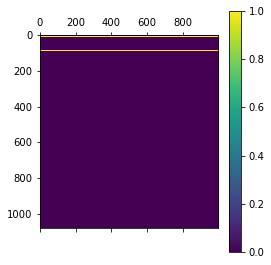

In [30]:
plt.matshow(np.isnan(t_flux_all))
plt.colorbar()

In [40]:
nan_idx = np.where(~np.isnan(t_flux_all[:,0]))

In [56]:
t_flux0.shape

(1068, 1000)

In [79]:
t_flux0 = t_flux_all[nan_idx][:, :300]

In [80]:
t_flux0.shape

(1068, 300)

In [81]:
t_flux0.mean(), t_flux0.std()

(-0.26866399426881005, 4.850359648360064)

In [82]:
t_flux0.min(), t_flux0.max()

(-160.67336655730813, 70.50760763529661)

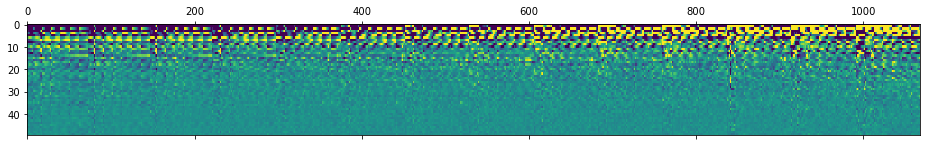

In [83]:
plt.matshow(t_flux0[:, :50].T, vmin=-3, vmax=3, aspect='auto')
# plt.colorbar()

In [84]:
t_flux00 = get_min_max_norm(t_flux0)

min -160.67336655730813 | max 70.50760763529661
mean 0.6938490640211624 | std 0.020980790764896874


In [85]:
t_flux00.shape

(1068, 300)

### AE dim = 32
'''
AE with one layer

In [86]:
from viska.AEn import NormAE

In [87]:
input_dim, latent_dim = 300, 32
# hidden_units = [128]
hidden_units = []
# reg1 = 1e-5
reg1 = None
encoder_dp=0.2
lr = 0.001
loss='mse'

In [88]:
model= NormAE(input_dim, latent_dim, hidden_units, reg1=reg1, encoder_dp=encoder_dp, loss=loss, lr=lr)
svs0, covs0 = analyze(model.ae)

[300, 32]
Model: "encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spec (InputLayer)            [(None, 300)]             0         
_________________________________________________________________
sequential_6 (Sequential)    (None, 32)                9632      
Total params: 9,632
Trainable params: 9,632
Non-trainable params: 0
_________________________________________________________________
Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 32)]              0         
_________________________________________________________________
sequential_7 (Sequential)    (None, 300)               9900      
Total params: 9,900
Trainable params: 9,900
Non-trainable params: 0
_________________________________________________________________
Model: "ae"
________________

In [90]:
# x_train = flux100k
x_train = t_flux00
model.fit(x_train, ep=500)

Epoch 1/500
61/61 [==============================] - 1s 3ms/step - loss: 0.1921 - val_loss: 0.0354
Epoch 2/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1119 - val_loss: 0.0269
Epoch 3/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1074 - val_loss: 0.0362
Epoch 4/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1050 - val_loss: 0.0175
Epoch 5/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1040 - val_loss: 0.0549
Epoch 6/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1034 - val_loss: 0.0209
Epoch 7/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1026 - val_loss: 0.0098
Epoch 8/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1024 - val_loss: 0.0322
Epoch 9/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1013 - val_loss: 0.0262
Epoch 10/500
61/61 [==============================] - 0s 2ms/step - loss: 0.1011 - val_loss: 0.0272
Epoch 11/

mse: 10.950604128949353 | mae: 177.57431212772323 | 


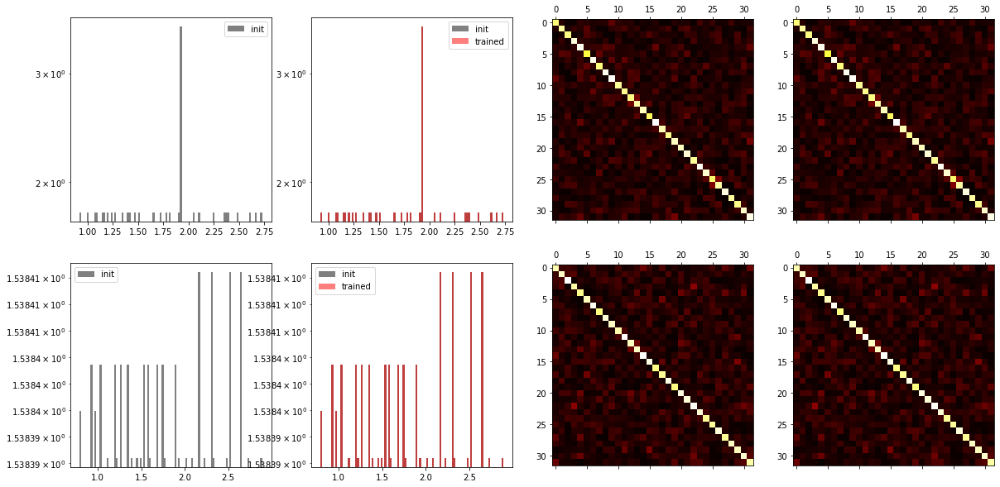

In [89]:
# loss: 0.0258 - val_loss: 0.0290
x_test = t_flux00
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

In [689]:
# x_train = flux100k
x_train = flux100kmm
model.fit(x_train, ep=200)

Epoch 1/200
5625/5625 [==============================] - 10s 2ms/step - loss: 0.0508 - val_loss: 0.0243
Epoch 2/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0435 - val_loss: 0.0262
Epoch 3/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0418 - val_loss: 0.0501
Epoch 4/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0411 - val_loss: 0.0239
Epoch 5/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0401 - val_loss: 0.0302
Epoch 6/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0402 - val_loss: 0.0321
Epoch 7/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0402 - val_loss: 0.0261
Epoch 8/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0394 - val_loss: 0.0265
Epoch 9/200
5625/5625 [==============================] - 9s 2ms/step - loss: 0.0393 - val_loss: 0.0290
Epoch 10/200
5625/5625 [==============================] - 9s 2ms/step - 

mse: 1.2942209491656325 | mae: 49.97221993017793 | 


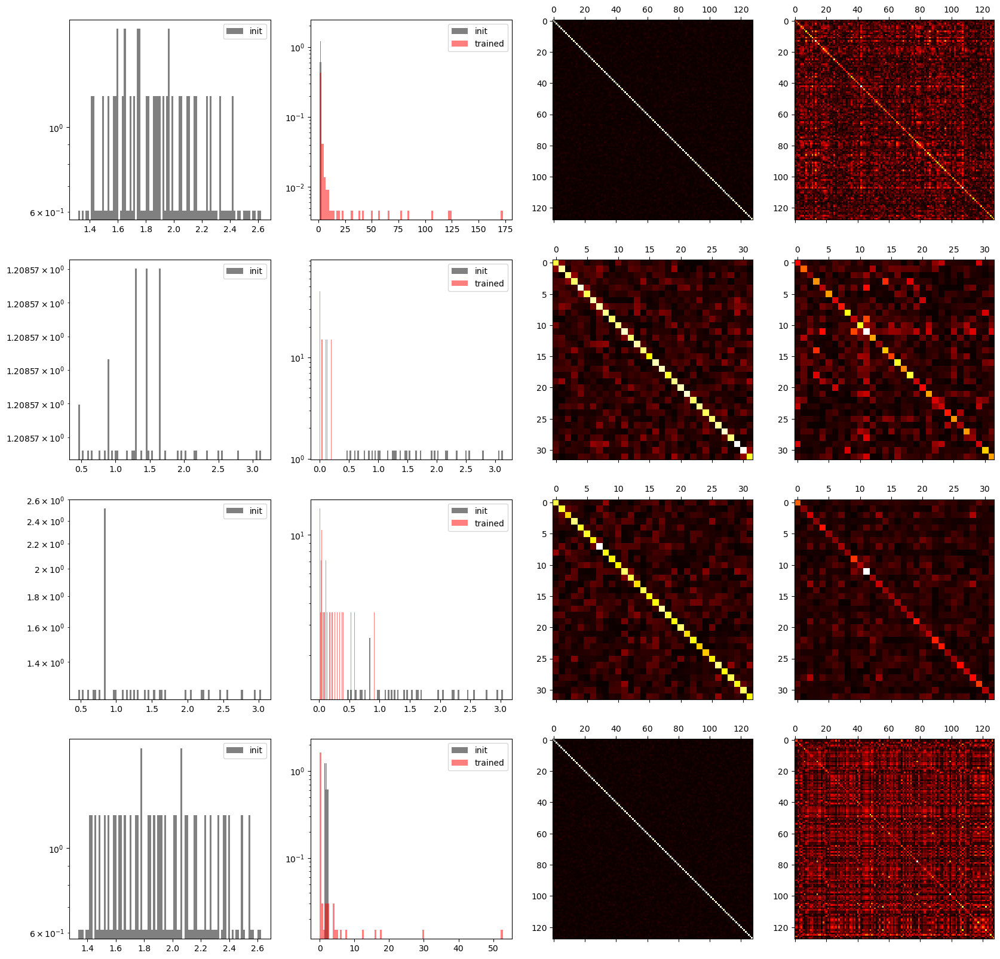

In [692]:
# loss: 0.0258 - val_loss: 0.0290
x_test = flux10k
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

mse: 0.6673430535208847 | mae: 27.679413886956933 | 


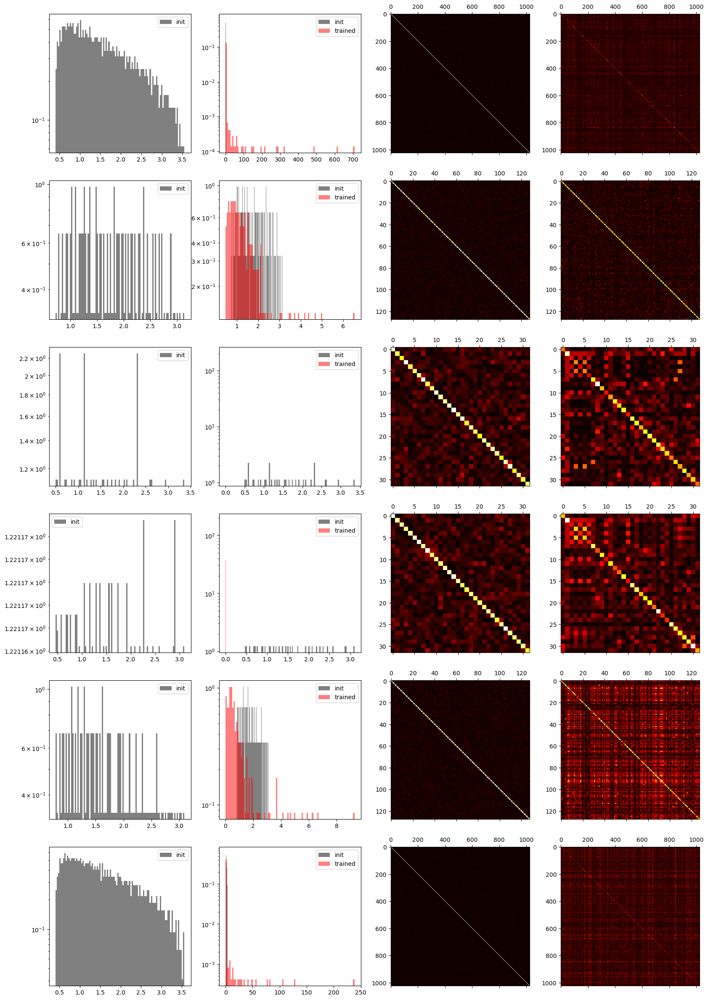

In [672]:
x_test = flux10k
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

In [657]:
svs60, covs60 = analyze(model.ae)

In [ ]:
x_test = -norm_flux0
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

In [653]:
svs1, covs1 = analyze(model.ae)

mse: 2.3682120443151535 | mae: 134.78986429577841 | 


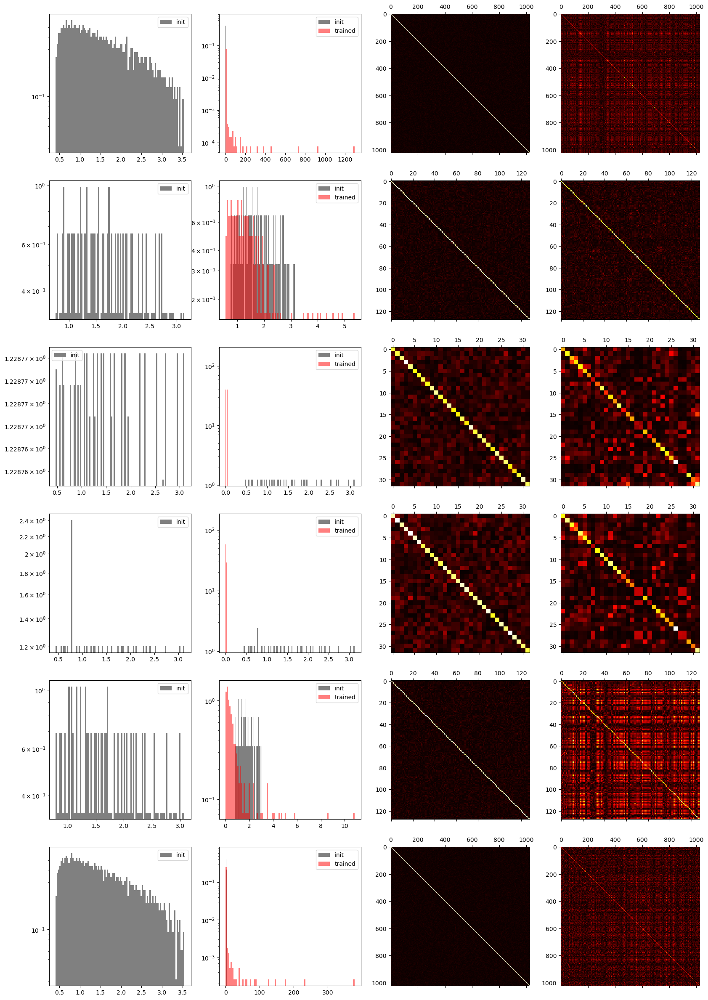

In [658]:
x_test = -v_norm_flux0
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

mse: 2.3845930117214245 | mae: 132.55910590271236 | 


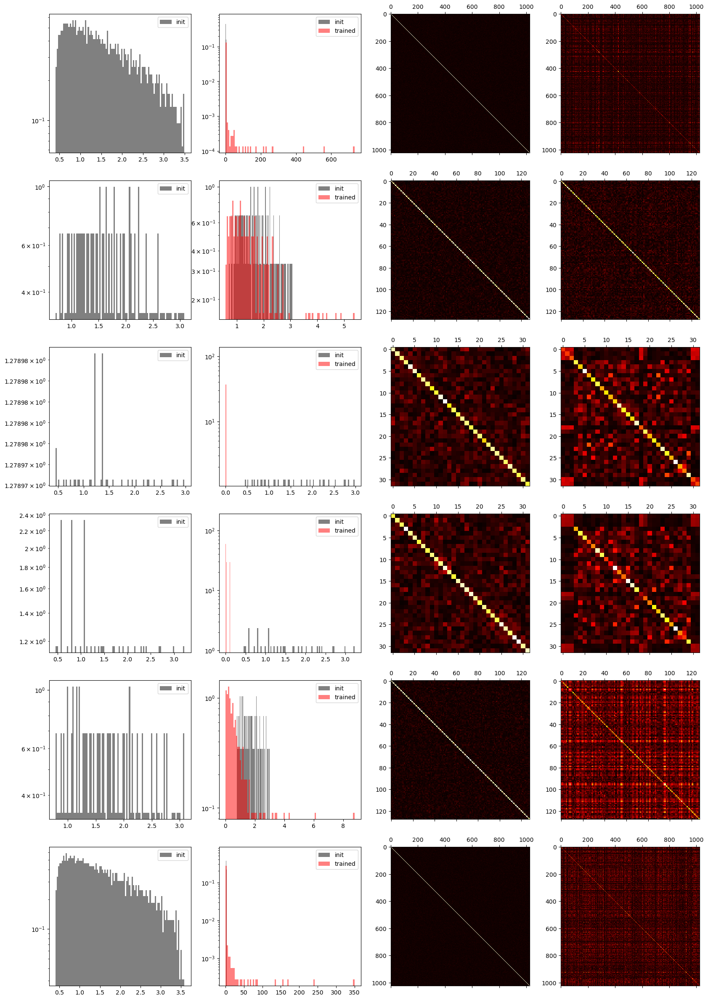

In [651]:
#ep20 input=-norm_flux0 lr=0.001 reg = 0 mae loss: 0.060 - val_loss: 0.07
x_test = -norm_flux0
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

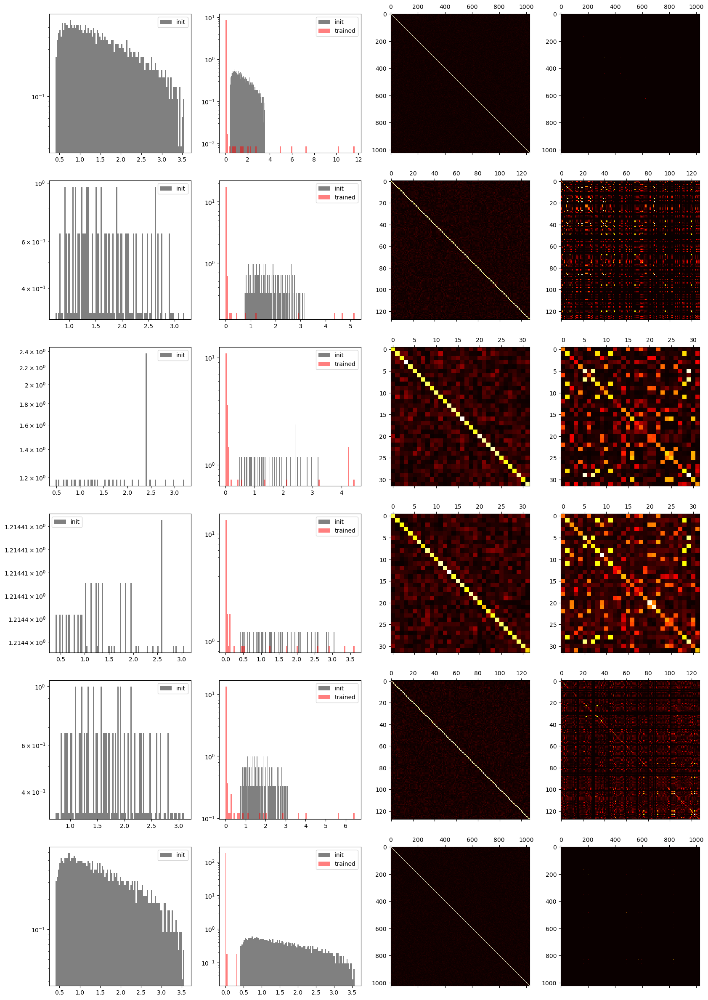

In [647]:
#ep20 input=-norm_flux0 lr=0.001 reg = 1e-5 mae loss: 0.092 - val_loss: 0.07
# x_test = flux10k
# _,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

mse: 1.9812879741261944 | mae: 113.42733995450376 | 


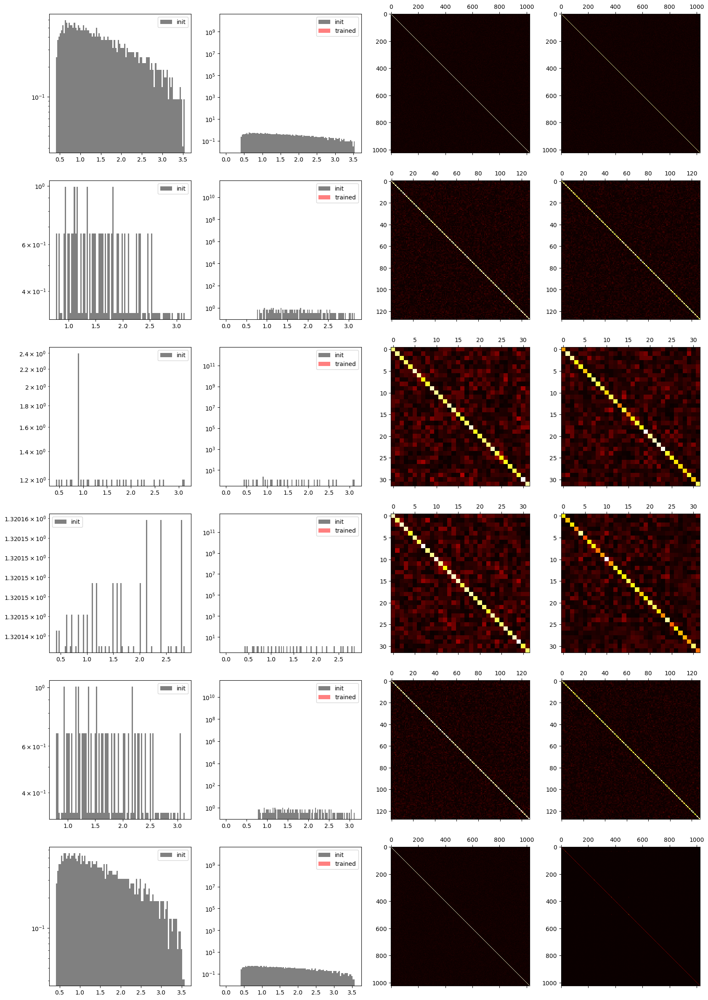

In [641]:
#ep20  lr=0.001 mae loss: 0.0277 - val_loss: 0.0232
x_test = flux10k
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

mse: 1.4598243320473405 | mae: 86.71991187174586 | 


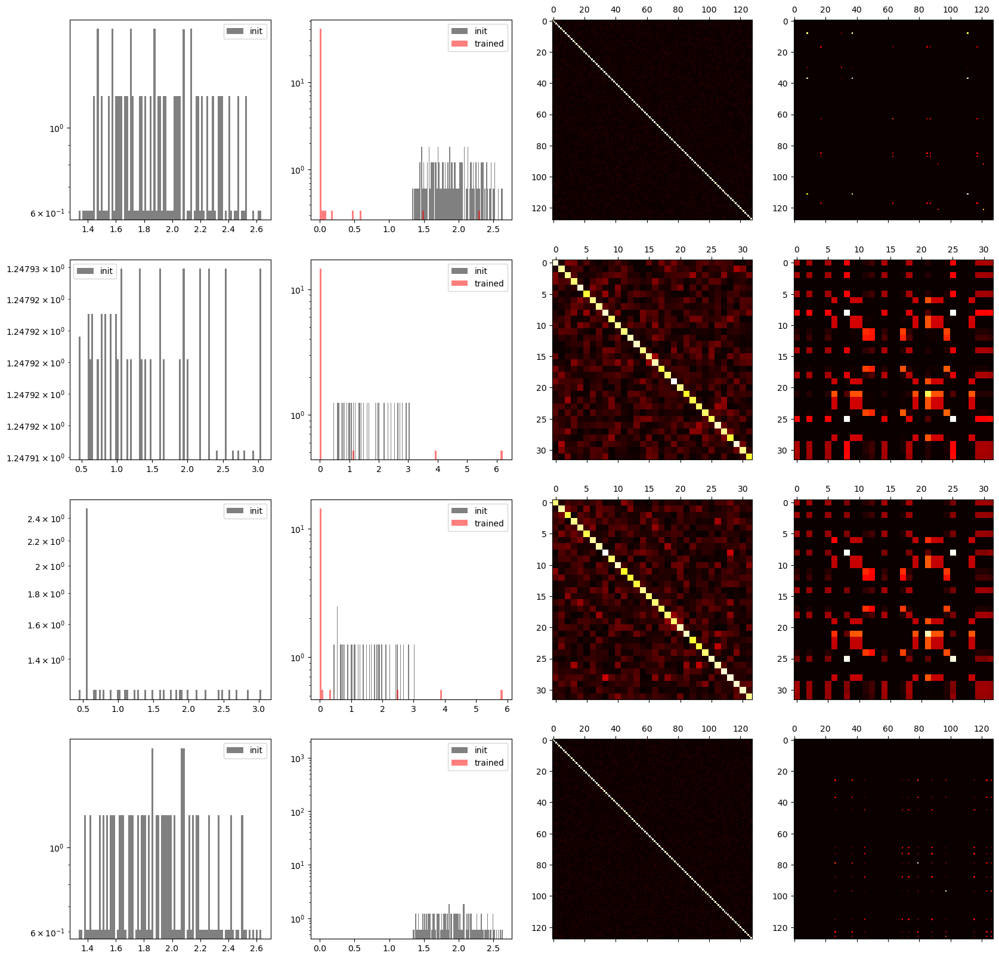

In [631]:
#ep20  lr=0.001 mae loss: 0.0277 - val_loss: 0.0232
x_test = flux10k
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

mse: 1.5576426055188572 | mae: 96.93746362714641 | 


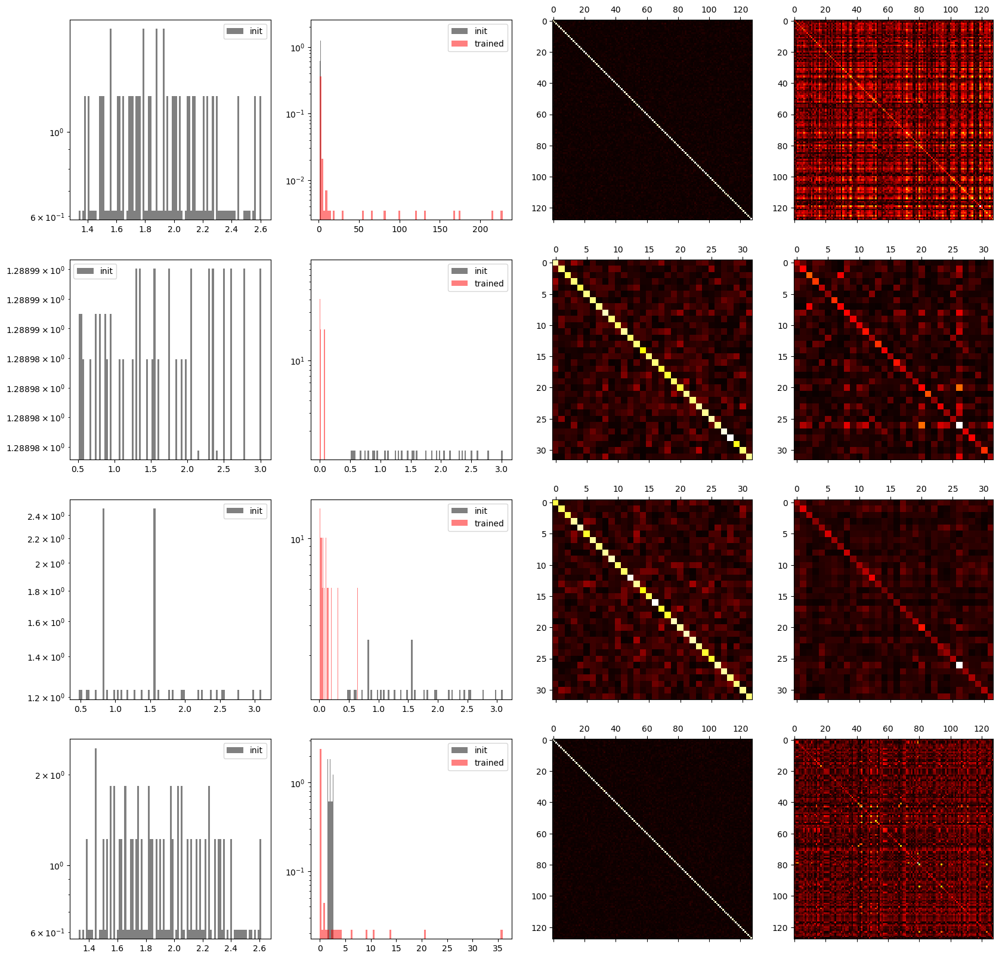

In [627]:
#ep20
x_test = flux10k
_,_,_ = get_ae_errs(x_test, model)
plot_ww0(svs0, covs0, model)

In [622]:
#ep10
x_test = flux10k
_,_,_ = get_ae_errs(x_test, model)

mse: 1.66024610551045 | mae: 102.62992853179625 | 


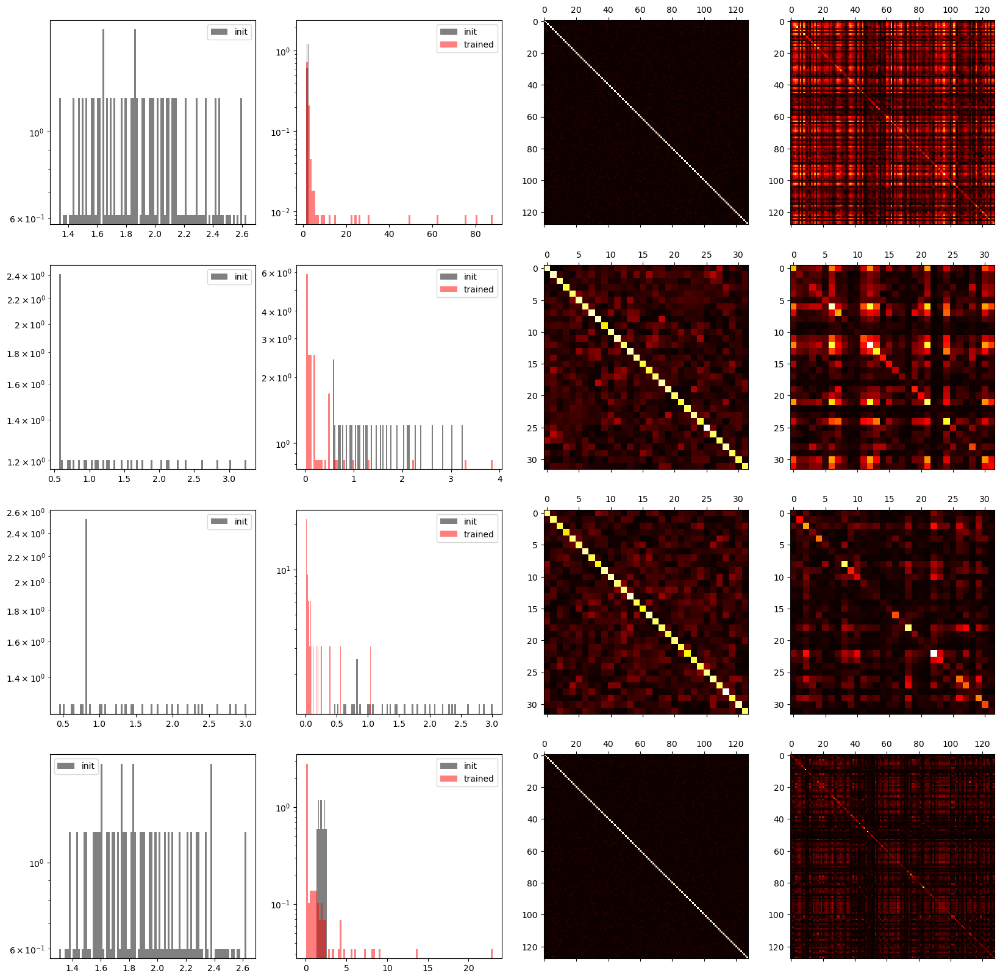

In [623]:
plot_ww0(svs0, covs0, model)

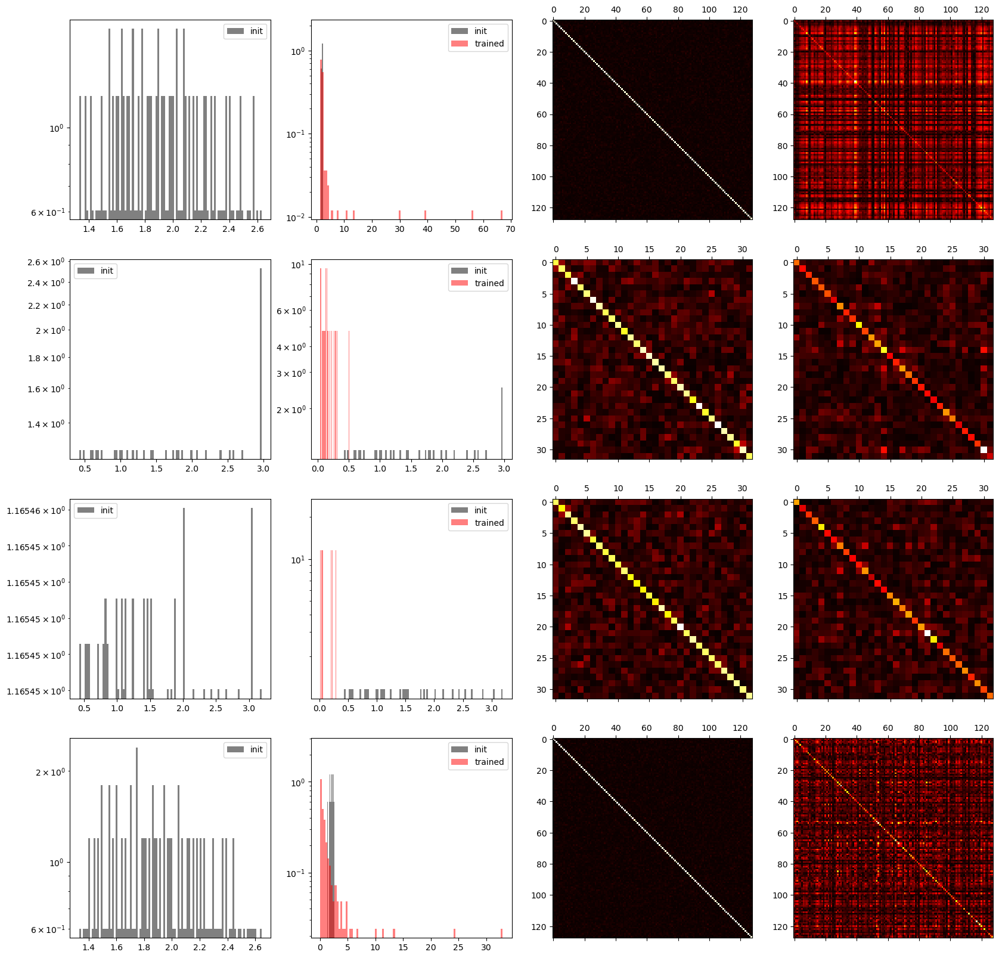

In [611]:
plot_ww0(svs0, covs0, ae_l32_dp)

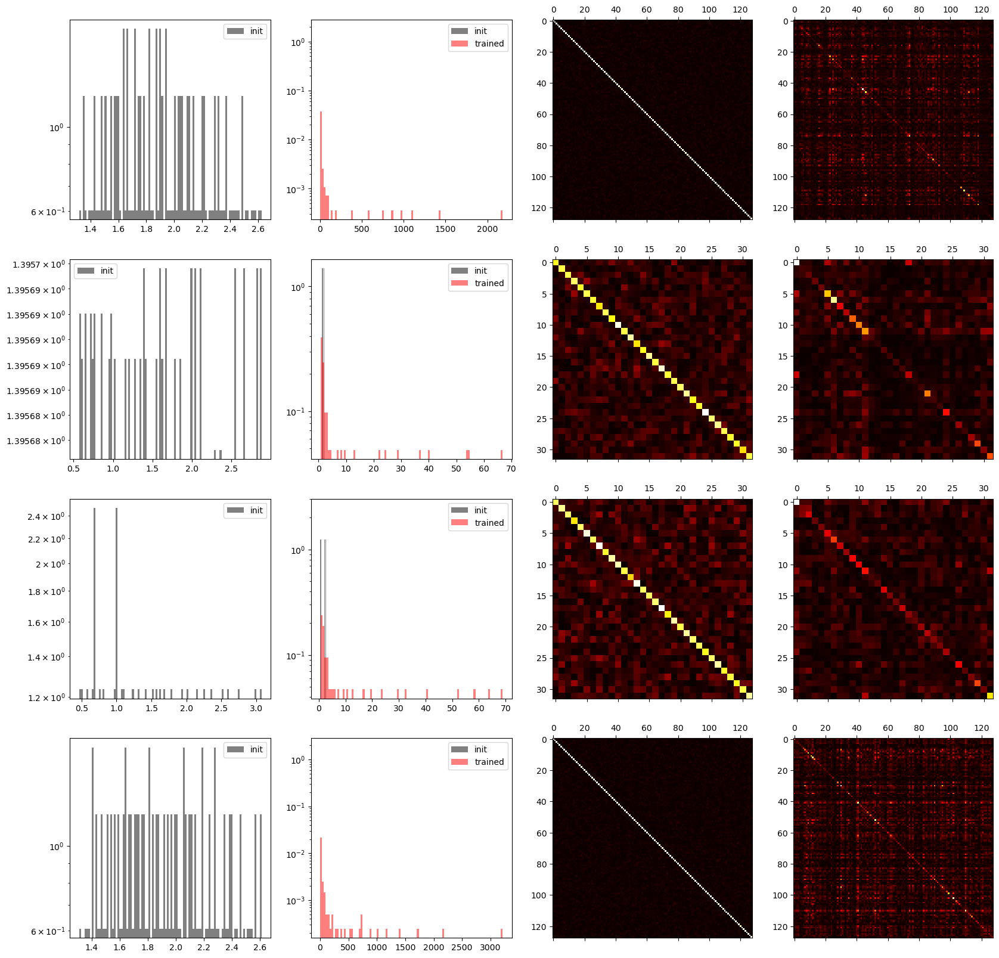

In [605]:
plot_ww(ae_l320, ae_l32)

In [559]:
# BN - RELU
x_test = flux100k[:10000]
_,_,_ = get_ae_errs(x_test, ae_l32)

mse: 0.45285085736566794 | mae: 27.26888109195844 | 


In [560]:
model = ae_l32.ae
ws = [weight for layer in model.layers for weight in layer.weights if 'kernel' in weight.name]

In [569]:
svs, covs = analyze(model)

(128, 128)
(32, 32)
(32, 32)
(128, 128)


In [578]:
svs[0]

<tf.Tensor: shape=(128,), dtype=float32, numpy=
array([2.97545728e+03, 2.18248608e+03, 1.42711926e+03, 1.10728040e+03,
       9.78480713e+02, 8.61905029e+02, 7.59095886e+02, 5.84583435e+02,
       3.92899811e+02, 1.80087738e+02, 1.43390076e+02, 1.09185234e+02,
       1.03246239e+02, 7.62079239e+01, 7.04878540e+01, 6.23864937e+01,
       4.95266991e+01, 4.63015327e+01, 3.81385269e+01, 3.59381523e+01,
       3.28813896e+01, 3.07916775e+01, 2.94025631e+01, 2.65939255e+01,
       2.56803360e+01, 2.33401318e+01, 2.14827347e+01, 2.02788067e+01,
       1.89225960e+01, 1.79308338e+01, 1.73295574e+01, 1.59351025e+01,
       1.50477133e+01, 1.39259768e+01, 1.33997755e+01, 1.27772722e+01,
       1.19309940e+01, 1.18156223e+01, 1.12554188e+01, 1.08311329e+01,
       9.94335461e+00, 9.68437576e+00, 9.13775539e+00, 8.84479332e+00,
       8.49189663e+00, 8.33256245e+00, 8.15632820e+00, 7.75056553e+00,
       7.52885771e+00, 7.20569277e+00, 6.70877218e+00, 6.59584522e+00,
       6.30932808e+00, 6.1663

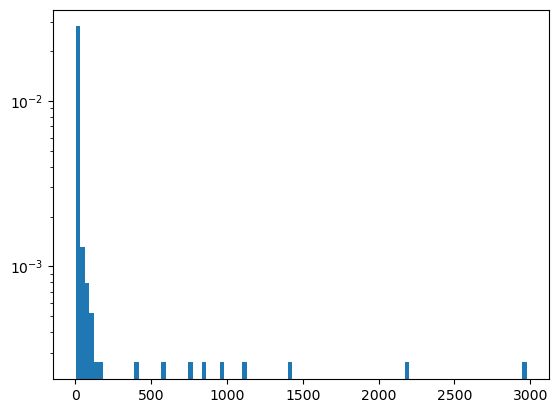

In [579]:
plot_s_hist(svs[0].numpy())

In [ ]:
svs, covs = analyze(model)

(array([112.,   5.,   2.,   0.,   0.,   0.,   1.,   0.,   0.,   1.,   0.,
          0.,   1.,   0.,   1.,   0.,   1.,   0.,   1.,   0.,   0.,   0.,
          0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   1.]),
 array([1.70327163e+00, 6.11783524e+01, 1.20653435e+02, 1.80128510e+02,
        2.39603592e+02, 2.99078674e+02, 3.58553741e+02, 4.18028839e+02,
        4.77503906e+02, 5.36979004e+02, 5.96454102e+02, 6.55929138e+02,
        7.15404236e+02, 7.74879333e+02, 8.34354370e+02, 8.93829468e+02,
        9.53304565e+02, 1.01277966e+03, 1.07225476e+03, 1.13172974e+03,
        1.19120483e+03, 1.25067993e+03, 1.31015503e+03, 1.36963013e+03,
        1.42910522e+03, 1.48858032e+03, 1.54805530e+03, 1.60753040e+03,
        1.66700549e+03, 1.72648059e+03, 1.78595569e+03, 1.84543079e+03,
        1.90490588e+03, 1.96438086e+03, 2.02385596e+03, 2.08333105e+03,
        2.

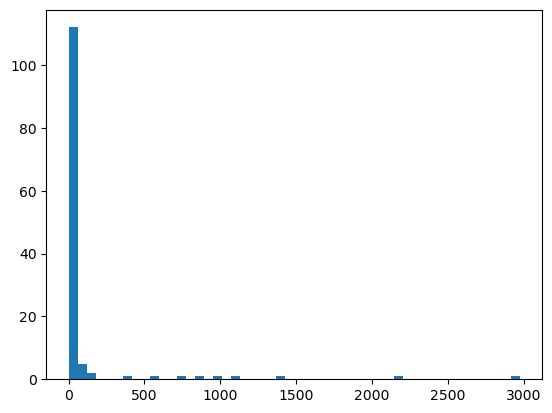

In [567]:
plt.hist(svs[0].numpy(), bins=50)

In [424]:
x_train = t2
ae.fit(x_train, ep=500)

Epoch 1/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0261 - val_loss: 0.0332
Epoch 2/500
5625/5625 [==============================] - 30s 5ms/step - loss: 0.0250 - val_loss: 0.0264
Epoch 3/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0249 - val_loss: 0.0451
Epoch 4/500
5625/5625 [==============================] - 29s 5ms/step - loss: 0.0247 - val_loss: 0.0305
Epoch 5/500
5625/5625 [==============================] - 29s 5ms/step - loss: 0.0247 - val_loss: 0.0332
Epoch 6/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0124 - val_loss: 0.0174
Epoch 7/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0123 - val_loss: 0.0157
Epoch 8/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0123 - val_loss: 0.0151
Epoch 9/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0122 - val_loss: 0.0179
Epoch 10/500
5625/5625 [==============================] - 28s 5m

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0126
Epoch 121/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0099 - val_loss: 0.0124
Epoch 122/500
 725/5625 [==>...........................] - ETA: 22s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 27s 5ms/step - loss: 0.0099 - val_loss: 0.0116
Epoch 124/500
5625/5625 [==============================] - 29s 5ms/step - loss: 0.0100 - val_loss: 0.0109
Epoch 125/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0099 - val_loss: 0.0108
Epoch 126/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0101 - val_loss: 0.0118
Epoch 127/500
5375/5625 [===========================>..] - ETA: 1s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0126
Epoch 149/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0099 - val_loss: 0.0103
Epoch 150/500
3659/5625 [==================>...........] - ETA: 9s - loss: 0.0101

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0114
Epoch 153/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0116
Epoch 154/500
5625/5625 [==============================] - 26s 5ms/step - loss: 0.0100 - val_loss: 0.0133
Epoch 155/500
5625/5625 [==============================] - 29s 5ms/step - loss: 0.0099 - val_loss: 0.0108
Epoch 156/500
2958/5625 [==============>...............] - ETA: 12s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 176/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0114
Epoch 177/500
2664/5625 [=============>................] - ETA: 14s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0110
Epoch 180/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0122
Epoch 181/500
 534/5625 [=>............................] - ETA: 23s - loss: 0.0095

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0101 - val_loss: 0.0111
Epoch 184/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0143
Epoch 185/500
1862/5625 [========>.....................] - ETA: 17s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0114
Epoch 205/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0099 - val_loss: 0.0118
Epoch 206/500
1202/5625 [=====>........................] - ETA: 19s - loss: 0.0101

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0106
Epoch 208/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0112
Epoch 209/500
3774/5625 [===================>..........] - ETA: 8s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0140
Epoch 212/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0099 - val_loss: 0.0115
Epoch 213/500
5141/5625 [==========================>...] - ETA: 2s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0097
Epoch 233/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0113
Epoch 234/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0115
Epoch 235/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0109
Epoch 236/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0106
Epoch 237/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0099 - val_loss: 0.0126
Epoch 238/500
2850/5625 [==============>...............] - ETA: 12s - loss: 0.0098

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0104
Epoch 262/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0108
Epoch 263/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0104
Epoch 264/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0109
Epoch 265/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0103
Epoch 266/500
5625/5625 [==============================] - 29s 5ms/step - loss: 0.0100 - val_loss: 0.0106
Epoch 267/500
 983/5625 [====>.........................] - ETA: 22s - loss: 0.0103

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0141
Epoch 276/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0104
Epoch 277/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0097
Epoch 278/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0101 - val_loss: 0.0122
Epoch 279/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0107
Epoch 280/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0135
Epoch 281/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0105
Epoch 282/500
5625/5625 [==============================] - 27s 5ms/step - loss: 0.0100 - val_loss: 0.0102
Epoch 283/500
5625/5625 [==============================] - 28s 5ms/step - loss: 0.0100 - val_loss: 0.0113
Epoch 284/500
5625/5625 [==============================] - 2

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0099 - val_loss: 0.0114
Epoch 304/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0099 - val_loss: 0.0110
Epoch 305/500
5625/5625 [==============================] - 30s 5ms/step - loss: 0.0100 - val_loss: 0.0135
Epoch 306/500
5625/5625 [==============================] - 31s 6ms/step - loss: 0.0100 - val_loss: 0.0125
Epoch 307/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0100 - val_loss: 0.0095
Epoch 308/500
2853/5625 [==============>...............] - ETA: 14s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0110
Epoch 328/500
5625/5625 [==============================] - 34s 6ms/step - loss: 0.0100 - val_loss: 0.0105
Epoch 329/500
3559/5625 [=================>............] - ETA: 10s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 33s 6ms/step - loss: 0.0100 - val_loss: 0.0120
Epoch 332/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0121
Epoch 333/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0100 - val_loss: 0.0108
Epoch 334/500
3278/5625 [================>.............] - ETA: 12s - loss: 0.0101

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0121
Epoch 354/500
5625/5625 [==============================] - 31s 6ms/step - loss: 0.0100 - val_loss: 0.0100
Epoch 355/500
5150/5625 [==========================>...] - ETA: 2s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0098
Epoch 358/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0120
Epoch 359/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0099 - val_loss: 0.0104
Epoch 360/500
4087/5625 [====================>.........] - ETA: 8s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0115
Epoch 379/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0099 - val_loss: 0.0100
Epoch 380/500
3221/5625 [================>.............] - ETA: 14s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 31s 5ms/step - loss: 0.0100 - val_loss: 0.0110
Epoch 383/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0099 - val_loss: 0.0101
Epoch 384/500
5625/5625 [==============================] - 34s 6ms/step - loss: 0.0100 - val_loss: 0.0106
Epoch 385/500
2589/5625 [============>.................] - ETA: 17s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 31s 6ms/step - loss: 0.0099 - val_loss: 0.0104
Epoch 405/500
5625/5625 [==============================] - 33s 6ms/step - loss: 0.0099 - val_loss: 0.0115
Epoch 406/500
3272/5625 [================>.............] - ETA: 13s - loss: 0.0101

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0101
Epoch 409/500
5625/5625 [==============================] - 31s 6ms/step - loss: 0.0100 - val_loss: 0.0109
Epoch 410/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0104
Epoch 411/500
2838/5625 [==============>...............] - ETA: 15s - loss: 0.0099

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0112
Epoch 431/500
5625/5625 [==============================] - 30s 5ms/step - loss: 0.0099 - val_loss: 0.0099
Epoch 432/500
4041/5625 [====================>.........] - ETA: 8s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0113
Epoch 435/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0099 - val_loss: 0.0115
Epoch 436/500
5625/5625 [==============================] - 33s 6ms/step - loss: 0.0101 - val_loss: 0.0125
Epoch 437/500
3065/5625 [===============>..............] - ETA: 13s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 31s 6ms/step - loss: 0.0100 - val_loss: 0.0110
Epoch 457/500
5625/5625 [==============================] - 30s 5ms/step - loss: 0.0100 - val_loss: 0.0100
Epoch 458/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0101 - val_loss: 0.0117
Epoch 459/500
5625/5625 [==============================] - 30s 5ms/step - loss: 0.0099 - val_loss: 0.0118
Epoch 460/500
5625/5625 [==============================] - 31s 5ms/step - loss: 0.0100 - val_loss: 0.0117
Epoch 461/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0103
Epoch 462/500
1095/5625 [====>.........................] - ETA: 22s - loss: 0.0100

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



5625/5625 [==============================] - 32s 6ms/step - loss: 0.0100 - val_loss: 0.0129
Epoch 483/500
5625/5625 [==============================] - 31s 6ms/step - loss: 0.0099 - val_loss: 0.0111
Epoch 484/500
5625/5625 [==============================] - 33s 6ms/step - loss: 0.0099 - val_loss: 0.0120
Epoch 485/500
5625/5625 [==============================] - 32s 6ms/step - loss: 0.0099 - val_loss: 0.0126
Epoch 486/500
5625/5625 [==============================] - 31s 6ms/step - loss: 0.0099 - val_loss: 0.0098
Epoch 487/500
1536/5625 [=======>......................] - ETA: 21s - loss: 0.0098

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [425]:
_,_,_ = get_ae_errs(x_train, ae)
svs_train = get_svs(ae, svs=[])

mse: 0.34824814101007895 | mae: 13.983293450128128 | 


In [ ]:
ws

In [561]:
len(ws)

4

In [ ]:
# _,_,_ = get_ae_errs(x_train, ae)
# svs_train = get_svs(ae, svs=[])
plot_esd(svs_init, svs_train=svs_train)

In [420]:
ww = ae_l32.ae.get_weights()

In [562]:
def analyze(model):
    svs, covs = [], []
    ws = [weight for layer in model.layers for weight in layer.weights if 'kernel' in weight.name]
    for w in ws:
        s, cov = get_s_from_ww(w)
        svs.append(s)
        covs.append(cov)
    return svs, covs

In [479]:
model = ae_l32.ae
ws = [weight for layer in model.layers for weight in layer.weights if 'kernel' in weight.name]

In [516]:
N, M = www._shape

In [517]:
N

256

In [511]:
www = ws[2]

In [ ]:
tf.linalg.matmul(
    a, b, transpose_a=True, transpose_b=False, adjoint_a=False, adjoint_b=False,
    a_is_sparse=False, b_is_sparse=False, name=None
)

In [528]:
def get_s_from_ww(w):
    N, M = w.shape
    ta = True if N > M else False
    tb = not ta
    cov = tf.linalg.matmul(w, w, transpose_a=ta, transpose_b=tb)
    print(cov.shape)
    s = tf.linalg.svd(cov, compute_uv=False)
    return s, cov

In [531]:
rd = tf.random.uniform(www.shape)

In [533]:
rd_s, rd_cov = get_s_from_ww(rd)

(32, 32)


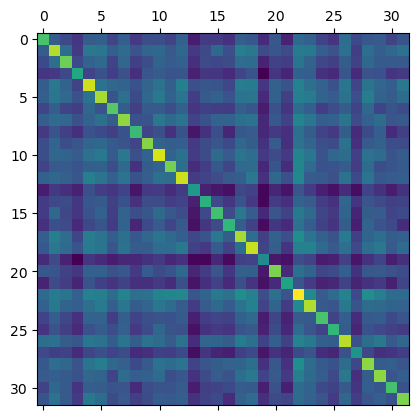

In [534]:
plt.matshow(rd_cov)

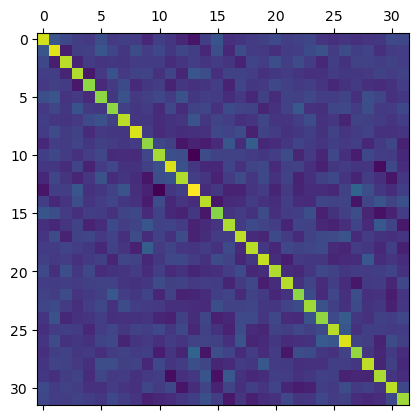

In [530]:
plt.matshow(cov)

In [529]:
s, cov = get_s_from_ww(tf.transpose(www))

(32, 32)


In [540]:
www_np = www.numpy()

In [542]:
www_np.max()

0.14432907

In [541]:
www_np.min()

-0.14414613

In [536]:
rd_s

<tf.Tensor: shape=(32,), dtype=float32, numpy=
array([2114.948   ,   36.051033,   35.533016,   31.288298,   31.064983,
         29.454874,   28.340443,   27.231728,   26.070042,   25.653929,
         24.93613 ,   23.65802 ,   23.420889,   22.910126,   21.98736 ,
         21.553701,   20.554565,   20.248346,   19.093151,   18.666302,
         17.461779,   16.915524,   16.087671,   15.598787,   15.074267,
         13.925747,   13.342916,   12.330589,   12.113056,   11.090294,
         10.113534,    9.549388], dtype=float32)>

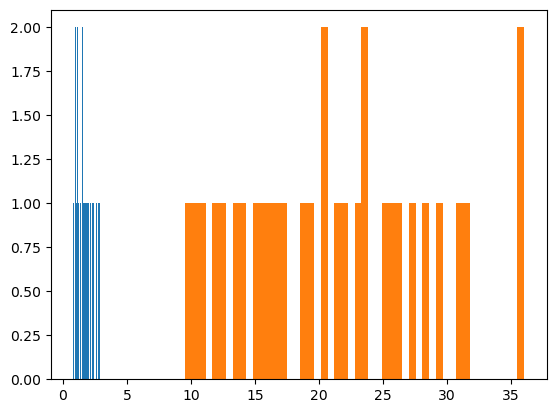

In [537]:
_ = plt.hist(s[1:].numpy(), bins=50)
_ = plt.hist(rd_s[1:].numpy(), bins=50)

In [486]:
ws[0]._

AttributeError: 'ResourceVariable' object has no attribute '_numpy'

In [465]:
weight[0]

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [ ]:
output = [idx for idx, element in enumerate(a_list) if condition(element)]

In [478]:
for layer in model.layers:
    print('===============layer=============',layer)
    for weight in layer.weights:
        if 'kernel' in weight.name:
            print('============name===============', weight.name)
            print('============weight=============', weight)
#         break
        print('==============================')

===============layer============= <tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7fcb642f9a00>
===============layer============= <tensorflow.python.keras.engine.functional.Functional object at 0x7fca282032b0>
============name=============== encod0/kernel:0
============weight============= <tf.Variable 'encod0/kernel:0' shape=(4096, 1024) dtype=float32, numpy=
array([[ 1.3468791e-02,  1.9242365e-02, -2.9567137e-02, ...,
         5.4560490e-03,  3.3374898e-02, -2.6790682e-02],
       [-1.0892699e-02, -3.2906432e-02, -2.9509183e-02, ...,
         8.3751157e-03, -2.2837691e-02,  6.9776662e-03],
       [ 6.3667744e-03, -1.0888128e-02, -1.2415795e-02, ...,
         1.2090679e-02, -1.7991094e-02, -2.5550380e-02],
       ...,
       [ 2.3785509e-02, -2.1657396e-02,  5.8576129e-03, ...,
        -3.1353801e-02,  2.4348456e-02, -2.0541184e-02],
       [ 2.5777724e-02, -7.5813383e-05, -1.6640430e-02, ...,
        -1.2445128e-02,  4.0886365e-03, -3.1370834e-02],
       [-2.255164

In [423]:

names

['encod0/kernel:0',
 'encod0/bias:0',
 'encod1/kernel:0',
 'encod1/bias:0',
 'encod2/kernel:0',
 'encod2/bias:0',
 'encod3/kernel:0',
 'encod3/bias:0',
 'encod4/kernel:0',
 'encod4/bias:0',
 'decod0/kernel:0',
 'decod0/bias:0',
 'decod1/kernel:0',
 'decod1/bias:0',
 'decod2/kernel:0',
 'decod2/bias:0',
 'decod3/kernel:0',
 'decod3/bias:0',
 'decod4/kernel:0',
 'decod4/bias:0']

In [370]:
kname=[]
for name in names:
    if ('dense' in name) and ('kernel' in name):
        kname.append(name)

In [371]:
kname

['dense_45/kernel:0',
 'dense_46/kernel:0',
 'dense_47/kernel:0',
 'dense_48/kernel:0']

In [374]:
ae_l32.ae.get_weights(name=kname[0])

TypeError: get_weights() got an unexpected keyword argument 'name'

In [373]:
for layer in ae_l32.ae.layers:
    print(layer.get_weights(name=kname))

TypeError: get_weights() got an unexpected keyword argument 'name'

In [359]:
weight[0]

<tf.Tensor: shape=(), dtype=float32, numpy=1.0>

In [379]:
ae_l32.ae.get_layer(name = kname[0])

ValueError: No such layer: dense_45/kernel:0.

In [375]:
for layer in ae_l32.ae.layers:
    for weight in layer.weights:
        print(weight)
        if tf.
#         name = weight.name 
#         if 'dense' in name and 'kernel' in name:
            
#             print(weight[0].)
#             print(weight.name)

<tf.Variable 'dense_99/kernel:0' shape=(4096, 2048) dtype=float32, numpy=
array([[-0.0140471 , -0.02461071, -0.01488743, ..., -0.02536277,
        -0.00423051,  0.01513002],
       [ 0.02052181,  0.02534282, -0.0263003 , ..., -0.02021889,
         0.01012234, -0.01413889],
       [-0.0068807 ,  0.01466838, -0.02398098, ...,  0.02139911,
        -0.02081743,  0.00388913],
       ...,
       [-0.0185757 , -0.02975306, -0.01617961, ...,  0.0072578 ,
         0.02005165, -0.01652528],
       [ 0.00395208, -0.00586998, -0.00722185, ..., -0.00180582,
         0.00656533, -0.00540854],
       [ 0.00864059, -0.02988492,  0.00663248, ...,  0.02994801,
        -0.01395041, -0.01090188]], dtype=float32)>
<tf.Variable 'dense_99/bias:0' shape=(2048,) dtype=float32, numpy=array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)>
<tf.Variable 'dense_100/kernel:0' shape=(2048, 512) dtype=float32, numpy=
array([[ 0.04031519, -0.02947147, -0.04443533, ...,  0.00577012,
        -0.01936471, -0.02793157],
    

In [350]:
weight.weight

AttributeError: 'ResourceVariable' object has no attribute 'weight'

In [313]:
len(svs_init

2

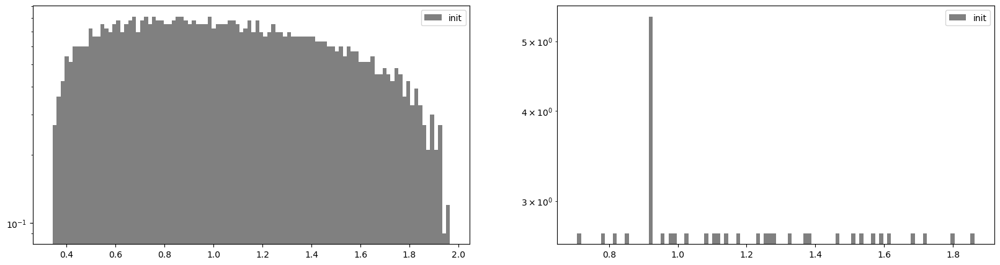

In [312]:
plot_esd(svs_init, svs_train=None)

In [ ]:
x_train = t2
ae.fit(x_train, ep=500)

In [210]:
ae_m32_reg = AE(latent_dim, hidden_units, reg1)

[4096, 4096]
Model: "ae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spec (InputLayer)            [(None, 4096)]            0         
_________________________________________________________________
encoder (Functional)         (None, 4096)              16797696  
_________________________________________________________________
decoder (Functional)         (None, 4096)              16781312  
Total params: 33,579,008
Trainable params: 33,570,816
Non-trainable params: 8,192
_________________________________________________________________


In [211]:
# x_train = 1 - x_train
x_train = t2
# x_train = -t1Norm
ae_m32_reg.fit(x_train, ep=50)

Epoch 1/50
5625/5625 [==============================] - 24s 4ms/step - loss: 1832.2087 - val_loss: 1812.1616
Epoch 2/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1807.8103 - val_loss: 1816.7292
Epoch 3/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1797.4219 - val_loss: 1796.7006
Epoch 4/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1787.1344 - val_loss: 1785.2576
Epoch 5/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1777.6727 - val_loss: 1774.9456
Epoch 6/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1767.1274 - val_loss: 1758.6108
Epoch 7/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1757.1401 - val_loss: 1744.3242
Epoch 8/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1747.5941 - val_loss: 1753.7062
Epoch 9/50
5625/5625 [==============================] - 23s 4ms/step - loss: 1737.7296 - val_loss: 1737.0887
Epoch 10/50
5625/56

In [426]:
# l = 4096, t2, l1_reg 0.01 l = 0.0094
_,_,_ = get_ae_errs(x_train, ae_m32)

KeyboardInterrupt: 

In [200]:
# h = 2048, t2, l1_reg 0.01 l = 0.0094
_,_,_ = get_ae_errs(x_train, ae_m32_reg)

mse: 0.38677478978528396 | mae: 14.232471653710423 | 


In [195]:
# h = 2048, t2, no reg l = 0.0028
_,_,_ = get_ae_errs(x_train, ae_m32)

mse: 0.1104618191242879 | mae: 4.37352504788106 | 


In [191]:
# h = 128, -t1Norm : input should be in [0,1]
ae_v32,_,_ = get_ae_errs(x_train, ae_m32)

mse: 0.8495133660035947 | mae: 33.63233942771802 | 


In [177]:
# reg = 0; dropout = 0 for decoder
ae_v32,_,_ = get_ae_errs(x_train, ae_m32)

mse: 0.11684602531145802 | mae: 4.524609531430286 | 


In [179]:
ae_m32_reg = AE(latent_dim)

[4096, 128, 32]
Model: "ae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spec (InputLayer)            [(None, 4096)]            0         
_________________________________________________________________
encoder (Functional)         (None, 32)                529184    
_________________________________________________________________
decoder (Functional)         (None, 4096)              533120    
Total params: 1,062,304
Trainable params: 1,061,728
Non-trainable params: 576
_________________________________________________________________


In [180]:
x_train = t2
ae_m32_reg.fit(x_train, ep=50)

Epoch 1/50
5625/5625 [==============================] - 20s 3ms/step - loss: 0.9095 - val_loss: 0.5982
Epoch 2/50
5625/5625 [==============================] - 18s 3ms/step - loss: 0.5930 - val_loss: 0.9027
Epoch 3/50
5625/5625 [==============================] - 18s 3ms/step - loss: 0.6013 - val_loss: 0.6030
Epoch 4/50
5625/5625 [==============================] - 16s 3ms/step - loss: 0.1894 - val_loss: 0.1931
Epoch 5/50
5625/5625 [==============================] - 17s 3ms/step - loss: 0.1876 - val_loss: 0.1883
Epoch 6/50
5625/5625 [==============================] - 17s 3ms/step - loss: 0.1872 - val_loss: 0.2558
Epoch 7/50
5625/5625 [==============================] - 16s 3ms/step - loss: 0.1832 - val_loss: 0.1955
Epoch 8/50
5625/5625 [==============================] - 15s 3ms/step - loss: 0.0638 - val_loss: 0.0611
Epoch 9/50
5625/5625 [==============================] - 17s 3ms/step - loss: 0.0615 - val_loss: 0.0615
Epoch 10/50
5625/5625 [==============================] - 14s 3ms/step - l

In [181]:
_,_,_ = get_ae_errs(x_train, ae_m32_reg)

mse: 0.49046316419711655 | mae: 18.091028530136164 | 


In [212]:
ae_m32.

In [283]:
model = ae_m32
svs = []
for layer in model.ae.layers:
    if len(layer.weights) >= 1:
#         print(layer.weights)
        mat=layer.weights[0].value().numpy()
        sv = np.linalg.svd(mat, compute_uv=False)    
        svs.append(sv)

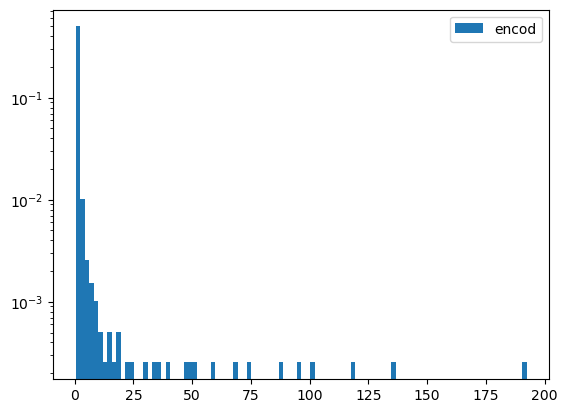

In [292]:
_= plt.hist(svs[0], bins=100, density=True, log=True, label=['encod', 'decod'])
plt.legend()

In [279]:
_,_,_ = get_ae_errs(x_train, ae_m32)

mse: 0.1104618191242879 | mae: 4.37352504788106 | 


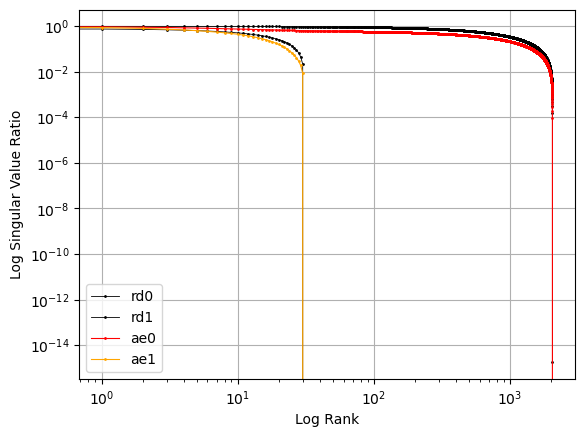

In [282]:
_,_ = ww(ae_m32, plot=1)

In [213]:
_,_,_ = get_ae_errs(x_train, ae_m32)

mse: 0.1104618191242879 | mae: 4.37352504788106 | 


In [215]:
ee = ae_m32.encoder

In [276]:
def ww(model):
    rds, svs = [], []
    for layer in model.encoder.layers:
        if len(layer.weights) >= 1:
    #         print(layer.weights)
            mat=layer.weights[0].value().numpy()
            rd = np.random.rand(*mat.shape)
            rd_sv = np.linalg.svd(rd, compute_uv=False)   
            rds.append(rd_sv)
            sv = np.linalg.svd(mat, compute_uv=False)    
            svs.append(sv)
    plot_ww_s(rds, svs)

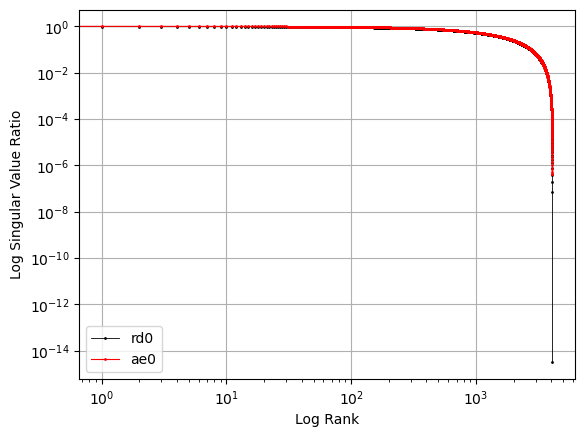

In [278]:
ww(ae_m32_reg)

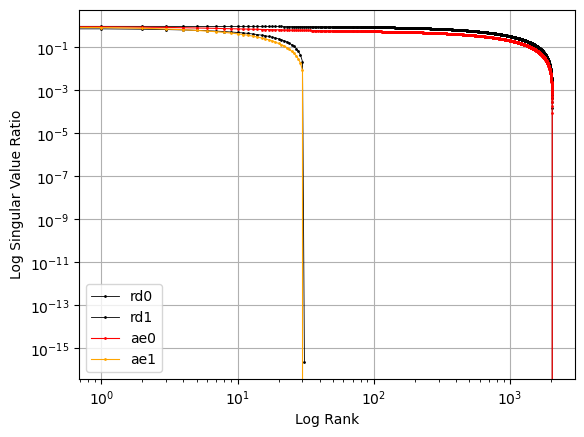

In [277]:
ww(ae_m32)

In [264]:
rds = []
svs = []
for mat in Wmats:
    rd = np.random.rand(*mat.shape)
    rd_sv = np.linalg.svd(rd, compute_uv=False)   
    rds.append(rd_sv)
    sv = np.linalg.svd(mat, compute_uv=False)    
    svs.append(sv)

In [263]:
mat.shape

(2048, 32)

In [261]:
rand_mat1 = np.random.rand(2024, 32)

In [262]:
rand_mat0 = np.random.rand(4096, 2024)

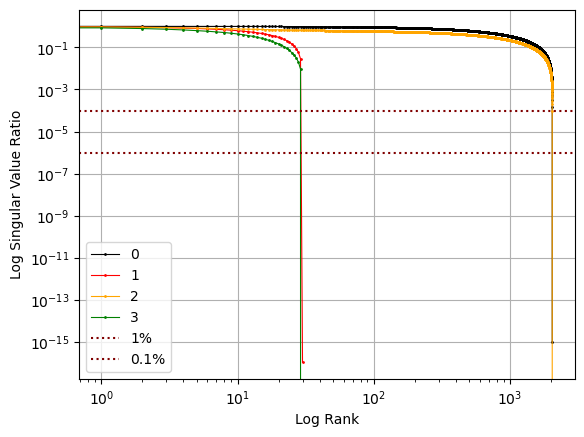

In [265]:
plot_svd_s([*rds, *svs])

In [240]:
sv = np.linalg.svd(Wmats, compute_uv=False)

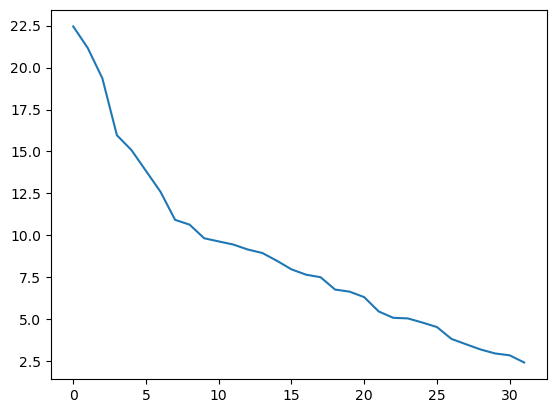

In [242]:
eval_

In [238]:
N, M = np.max(Wmats[0].shape), np.min(Wmats[0].shape)

In [235]:
Wmats.shape

(2048, 32)

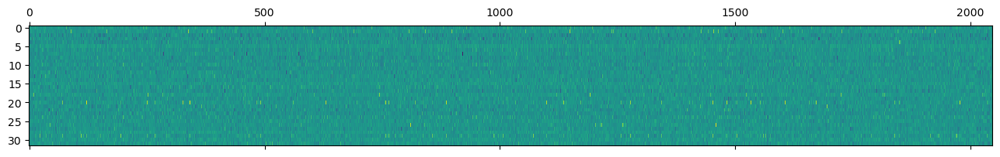

In [237]:
plt.matshow(Wmats.T, aspect='auto')

In [216]:
ee.__dict__

{'_self_setattr_tracking': True,
 '_is_model_for_instrumentation': True,
 '_instrumented_keras_api': True,
 '_instrumented_keras_layer_class': False,
 '_instrumented_keras_model_class': True,
 '_trainable': True,
 '_stateful': False,
 'built': True,
 '_input_spec': None,
 '_build_input_shape': TensorShape([None, 4096]),
 '_saved_model_inputs_spec': TensorSpec(shape=(None, 4096), dtype=tf.float32, name='spec'),
 '_supports_masking': True,
 '_name': 'encoder',
 '_activity_regularizer': None,
 '_trainable_weights': [],
 '_non_trainable_weights': [],
 '_updates': [],
 '_thread_local': <_thread._local at 0x7fcaac13b590>,
 '_callable_losses': [],
 '_losses': [],
 '_metrics': [],
 '_metrics_lock': <unlocked _thread.lock object at 0x7fca940b4240>,
 '_dtype_policy': <Policy "float32">,
 '_compute_dtype_object': tf.float32,
 '_autocast': False,
 '_self_tracked_trackables': [<tensorflow.python.keras.engine.input_layer.InputLayer at 0x7fca94492370>,
 '_inbound_nodes_value': [<tensorflow.python.ker

In [214]:
ae_m32.__dict__

{'input_dim': 4096,
 'encoder_input': <KerasTensor: shape=(None, 4096) dtype=float32 (created by layer 'spec')>,
 'latent_dim': 32,
 'hidden_units': array([2048]),
 'units': [4096, 2048, 32],
 'l1_reg': None,
 'encoder': <tensorflow.python.keras.engine.functional.Functional at 0x7fca587e7220>,
 'decoder': <tensorflow.python.keras.engine.functional.Functional at 0x7fca7455d7f0>,
 'opt': <tensorflow.python.keras.optimizer_v2.adam.Adam at 0x7fca7455dd00>,
 'loss': 'mae',
 'ae': <tensorflow.python.keras.engine.functional.Functional at 0x7fc9f07467c0>,
 'callbacks': [<tensorflow.python.keras.callbacks.EarlyStopping at 0x7fc9f0746100>,
  <tensorflow.python.keras.callbacks.ReduceLROnPlateau at 0x7fca947716a0>]}

### DAE dim = 32

In [15]:
from viska.DAE import DumbAE

In [43]:
latent_dim = 32

In [37]:
model = DumbAE(latent_dim)

[4096, 32]
Model: "ae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spec (InputLayer)            [(None, 4096)]            0         
_________________________________________________________________
encoder (Functional)         (None, 32)                131104    
_________________________________________________________________
decoder (Functional)         (None, 4096)              135168    
Total params: 266,272
Trainable params: 266,272
Non-trainable params: 0
_________________________________________________________________


In [39]:
# x_train = 1 - x_train
m = model
m.fit(x_train, ep=25)

Epoch 1/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 2/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 3/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 4/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 5/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 6/25
5625/5625 [==============================] - 6s 1ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 7/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 8/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 9/25
5625/5625 [==============================] - 6s 1ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 10/25
5625/5625 [==============================] - 7s 1ms/step - loss: 0.001

In [40]:
m = model
ae_val = m.ae.predict(x_train)

In [41]:
mse_err = np.sqrt(np.sum((x_train - ae_val)**2, axis = 1)).mean()
mae_err = np.sum(abs(x_train - ae_val), axis = 1).mean()

mse_err, mae_err

(0.12142839055315448, 4.425384645032142)

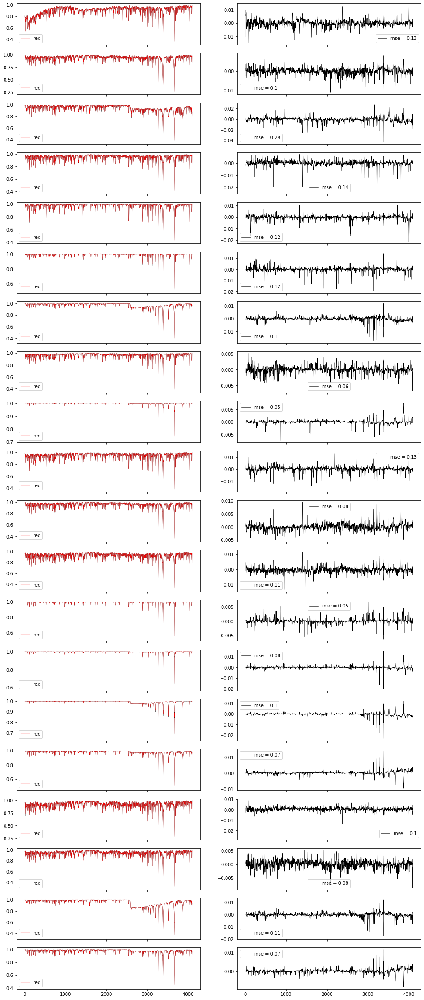

In [42]:
plot_rec(x_train, ae_val, N=20, label='rec')

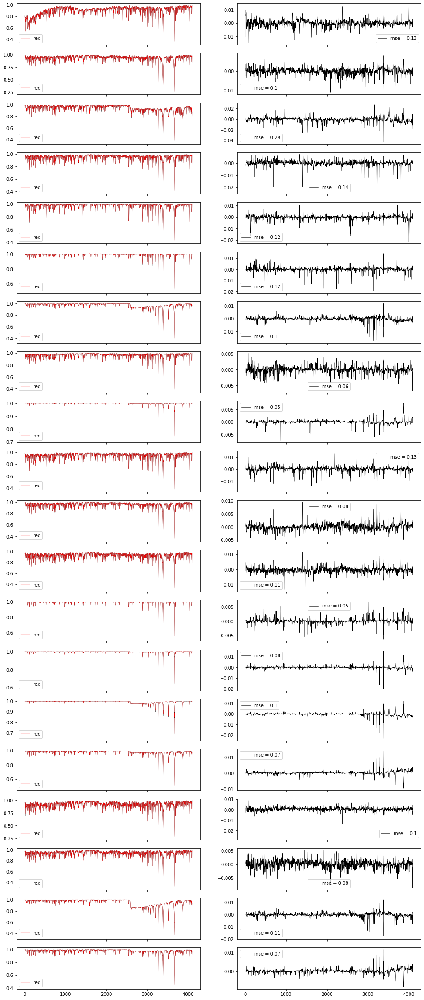

In [42]:
plot_rec(x_train, ae_val, N=20, label='rec')

### AE dim = 8

In [53]:
from viska.DAE_mae import DumbAE X_recons.mean(0)

In [47]:
latent_dim = 8

In [48]:
m8 = DumbAE(latent_dim)

[4096, 8]
Model: "ae"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
spec (InputLayer)            [(None, 4096)]            0         
_________________________________________________________________
encoder (Functional)         (None, 8)                 32776     
_________________________________________________________________
decoder (Functional)         (None, 4096)              36864     
Total params: 69,640
Trainable params: 69,640
Non-trainable params: 0
_________________________________________________________________


In [49]:
# x_train = 1 - x_train
m8.fit(x_train, ep=30)

Epoch 1/30
5625/5625 [==============================] - 6s 1ms/step - loss: 0.0220 - val_loss: 0.0202
Epoch 2/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0127 - val_loss: 0.0106
Epoch 3/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0097 - val_loss: 0.0093
Epoch 4/30
5625/5625 [==============================] - 6s 1ms/step - loss: 0.0092 - val_loss: 0.0111
Epoch 5/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0088 - val_loss: 0.0159
Epoch 6/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0086 - val_loss: 0.0104
Epoch 7/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0086 - val_loss: 0.0067
Epoch 8/30
5625/5625 [==============================] - 6s 1ms/step - loss: 0.0084 - val_loss: 0.0072
Epoch 9/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.0083 - val_loss: 0.0085
Epoch 10/30
5625/5625 [==============================] - 7s 1ms/step - loss: 0.008

mse: 0.37683082601617374 | mae: 12.70632499113208 | 


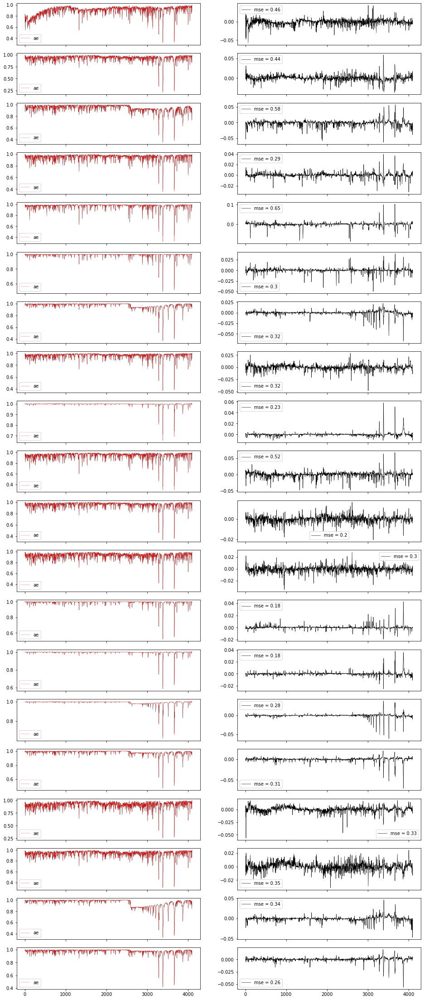

In [52]:
ae_val8 = get_errs(x_train, m8)

mse: 0.3753437655284042 | mae: 12.630768040455798 | 


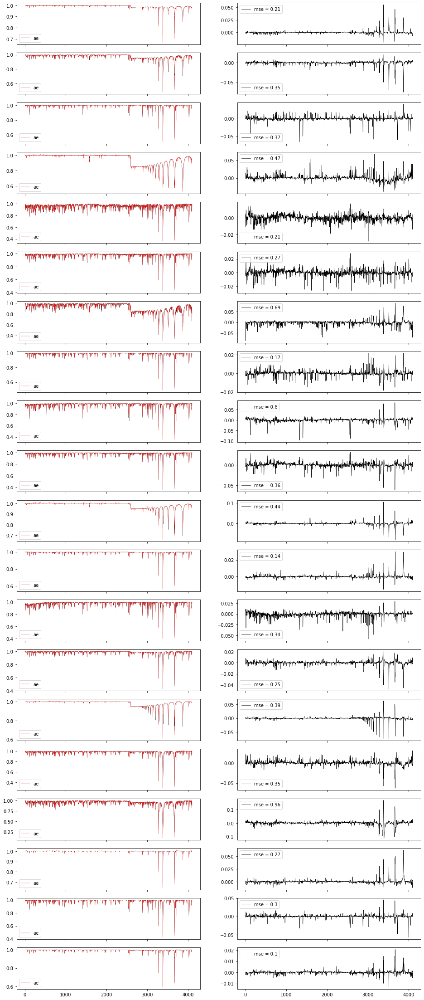

In [58]:
ae_pred8 = get_errs(x_test, m8)

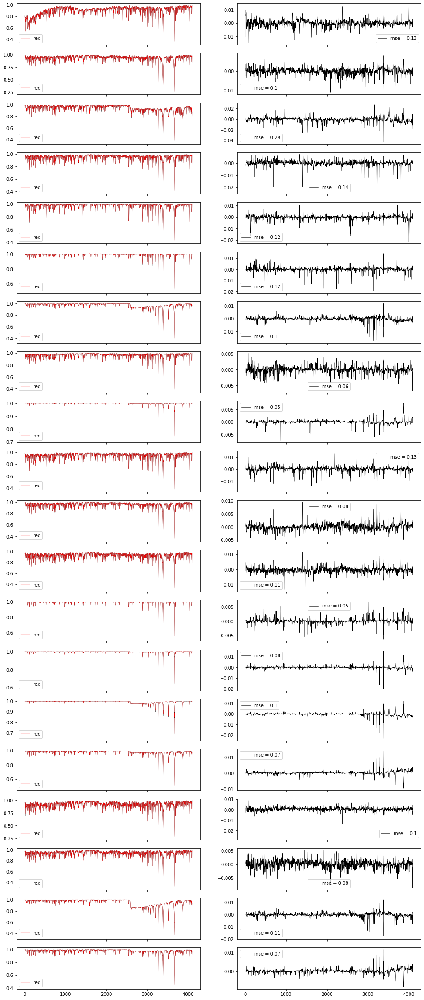

In [42]:
plot_rec(x_train, ae_val, N=20, label='rec')

### Eval

In [217]:
np.max(np.log(v_flux + 1) / np.log(2))

1.0089044535484324

In [215]:
np.max(v_flux +1 )

1.0123823670188117

In [213]:
x_test = 1 - np.log(v_flux + 1) / np.log(2)
np.max(x_test), x_test.shape

(0.8888504495861103, (10000, 4096))

In [54]:
x_test

array([[0.99963331, 0.99969046, 0.99971612, ..., 0.97294537, 0.97190207,
        0.97374585],
       [0.99872751, 0.9994704 , 0.99975908, ..., 0.92808307, 0.93961593,
        0.96563437],
       [0.9987378 , 0.99949994, 0.99943323, ..., 0.99800174, 0.99707528,
        0.99973151],
       ...,
       [0.97581195, 0.98311608, 0.96037371, ..., 0.90718333, 0.85332371,
        0.99476012],
       [0.98655114, 0.9935221 , 0.99251664, ..., 0.8037149 , 0.81935527,
        0.9456633 ],
       [0.98676043, 0.98975484, 0.97047664, ..., 0.94182771, 0.90135984,
        0.99830604]])

In [ ]:
get_e

In [26]:
# x_test = 1 - v_flux
ae_pred = m8.ae.predict(x_test)

In [27]:
err = np.sqrt(np.sum((x_test - ae_pred)**2, axis = 1)).mean()
err

0.16604516175632816

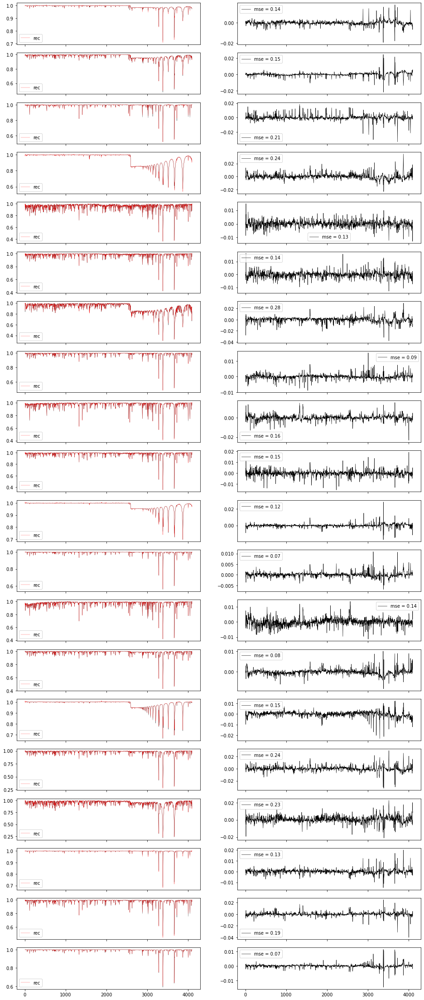

In [28]:
plot_rec(x_test, ae_pred, N=20, label='rec')

### PCA

In [29]:
with h5py.File(TRAIN_PATH, 'r') as f:
    u_train = f['U'][()]

In [30]:
with h5py.File(TEST_PATH, 'r') as f:
    pca_test = f['X'][()]

In [44]:
latent_dim = 8

In [75]:
pca_pred, mse_err, mae_err = get_pca_errs(u_train, pca_test, latent_dim, plot_n=None)

mse: 0.040595358880748986 | mae: 1.644736834126014 | 


In [76]:
mse_errs, mae_errs = [], []
lat_dim_list = [8, 16 ,32, 64, 128, 256, 512, 1024]
for latent_dim in lat_dim_list:
    _, mse_err, mae_err = get_pca_errs(u_train, pca_test, latent_dim, plot_n=None)    
    mse_errs.append(mse_err)
    mae_errs.append(mae_err)    

mse: 0.3821924524837633 | mae: 15.417742117857578 | 
mse: 0.12981563645715533 | mae: 5.3000860481987 | 
mse: 0.040595358880748986 | mae: 1.644736834126014 | 
mse: 0.011522161565800645 | mae: 0.4755597018881592 | 
mse: 0.002413587208045338 | mae: 0.10210117789197846 | 
mse: 0.0004857450405461853 | mae: 0.022831326460185934 | 
mse: 0.00018852338474786124 | mae: 0.009331724925489383 | 
mse: 7.22633194175626e-05 | mae: 0.0036512303201276107 | 


In [87]:
print(np.around(mse_errs,2))
print(np.around(mae_errs,2))

[0.38 0.13 0.04 0.01 0.   0.   0.   0.  ]
[1.542e+01 5.300e+00 1.640e+00 4.800e-01 1.000e-01 2.000e-02 1.000e-02
 0.000e+00]


In [82]:
plt.style.use('ieee')

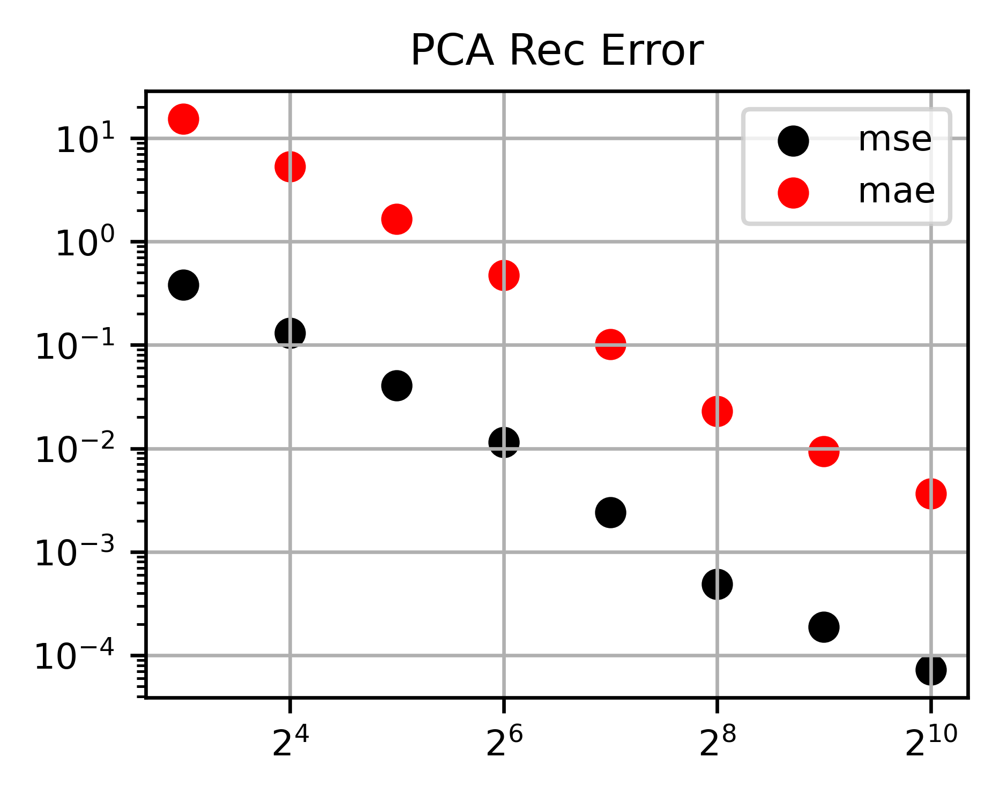

In [89]:
plt.scatter(lat_dim_list, mse_errs, label='mse')
plt.scatter(lat_dim_list, mae_errs, label='mae')
plt.legend()
plt.yscale('log')
plt.xscale('log', base=2)
plt.title('PCA Rec Error')
plt.grid()

### Latent Space

# Calculate principal components and expand on truncated basis

In [95]:
M = 50

PC = np.dot(X, U[:, 0:M])
PC.shape

(10000, 50)

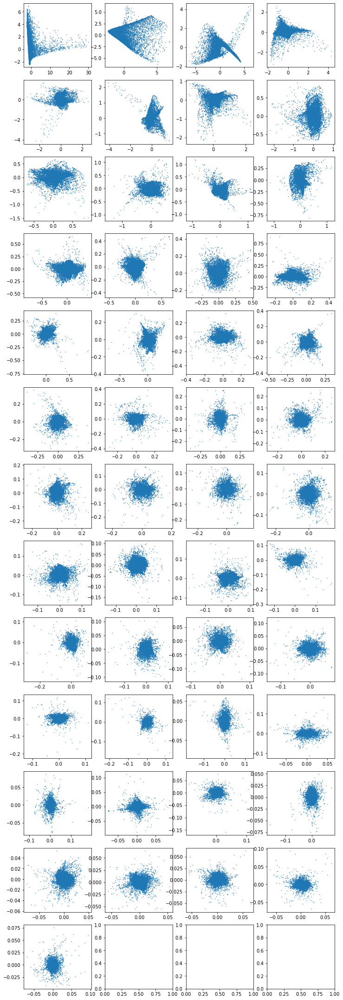

In [96]:
f, axs = plt.subplots(int(np.ceil(M / 4)), 4, figsize=(12, 3 * np.ceil(M / 4)))
axs = axs.flatten()

for i in range(M - 1):
    axs[i].plot(PC[:, i], PC[:, i + 1], '.', ms=1)

# Reconstruct from truncated basis

In [100]:
rflux = np.exp(avg + np.dot(PC, U[:, 0:M].transpose()))
rflux.shape

(10000, 4096)

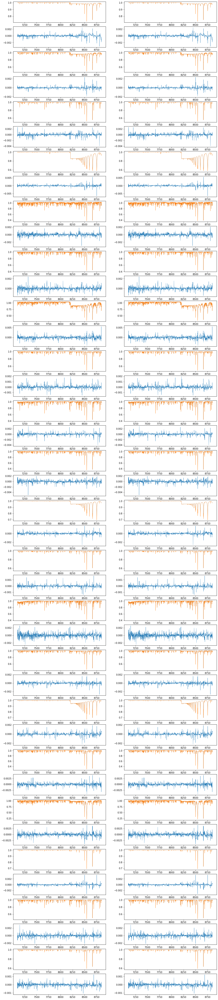

In [101]:
N = 20
f, axs = plt.subplots(2 * N, 2, figsize=(16, 4 * N), squeeze=False)

for i in range(N):
    axs[2 * i, 0].plot(wave, flux[i, :], lw=0.3)
    axs[2 * i, 0].plot(wave, rflux[i, :], lw=0.6)
    
    axs[2 * i, 1].plot(wave, flux[i, :], lw=0.3)
    axs[2 * i, 1].plot(wave, rflux[i, :], lw=0.6)
#     axs[2 * i, 1].set_xlim(8000, 9000)
    
    axs[2 * i + 1, 0].plot(wave, (flux[i, :] - rflux[i, :]) / flux[i, :], lw=0.5)
    
    axs[2 * i + 1, 1].plot(wave, (flux[i, :] - rflux[i, :]) / flux[i, :], lw=0.5)
#     axs[2 * i + 1, 1].set_xlim(8000, 9000)

In [ ]:
PC